In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd
import cv2
import random
import numpy as np
%matplotlib inline
SEED = 69

In [2]:
!ls ../data

folds		       test.csv       train32.csv    train_messidor.csv
logs.md		       test_images    train_all.csv  train_meta.csv
npy_files	       test_meta.csv  train.csv      train_old.csv
sample_submission.csv  train12.csv    train_images


In [4]:
train_df = pd.read_csv('../data/train.csv')
train_mes = pd.read_csv('../data/train_messidor.csv')
train_old = pd.read_csv('../data/train_old.csv')
test_df = pd.read_csv('../data/sample_submission.csv')

In [5]:
train_df.head()

,id_code,diagnosis
0,000c1434d8d7,2
1,001639a390f0,4
2,0024cdab0c1e,1
3,002c21358ce6,0
4,005b95c28852,0


In [6]:
test_df.head()

,id_code,diagnosis
0,0005cfc8afb6,0
1,003f0afdcd15,0
2,006efc72b638,0
3,00836aaacf06,0
4,009245722fa4,0


In [7]:
train_df.info(), test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3662 entries, 0 to 3661
Data columns (total 2 columns):
id_code      3662 non-null object
diagnosis    3662 non-null int64
dtypes: int64(1), object(1)
memory usage: 57.3+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1928 entries, 0 to 1927
Data columns (total 2 columns):
id_code      1928 non-null object
diagnosis    1928 non-null int64
dtypes: int64(1), object(1)
memory usage: 30.2+ KB


(None, None)

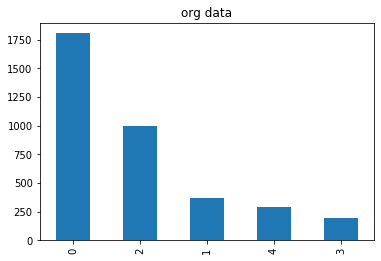

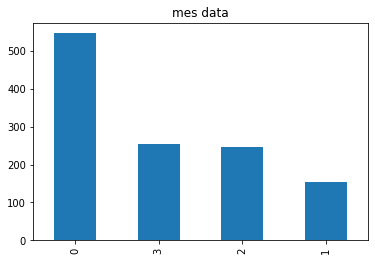

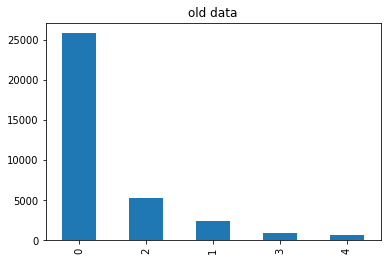

In [7]:
train_df['diagnosis'].value_counts().plot(kind="bar", title='org data'); plt.show();
train_mes['diagnosis'].value_counts().plot(kind="bar", title='mes data'); plt.show();
train_old['diagnosis'].value_counts().plot(kind="bar", title='old data'); plt.show();

In [9]:
train_old['diagnosis'].value_counts(normalize=True),  train_old['diagnosis'].value_counts()

(0    0.734783
 2    0.150658
 1    0.069550
 3    0.024853
 4    0.020156
 Name: diagnosis, dtype: float64, 0    25810
 2     5292
 1     2443
 3      873
 4      708
 Name: diagnosis, dtype: int64)

In [34]:
train_old.shape

(35126, 2)

In [12]:
def sample(obj): # [5]
    return obj.sample(n=count_dict[obj.name], replace=False)

count_dict = {
    0: 10000,
    2: 5292,
    1: 2443,
    3: 873,
    4: 708
} # approx dist of org data, notice the order of keys

sampled_df = train_old.groupby('diagnosis').apply(sample).reset_index(drop=True)


In [17]:
train_df['diagnosis'].value_counts(normalize=True)

0    0.492900
2    0.272802
1    0.101038
4    0.080557
3    0.052703
Name: diagnosis, dtype: float64

In [13]:
sampled_df['diagnosis'].value_counts(normalize=True)

0    0.517706
2    0.273970
1    0.126475
3    0.045196
4    0.036654
Name: diagnosis, dtype: float64

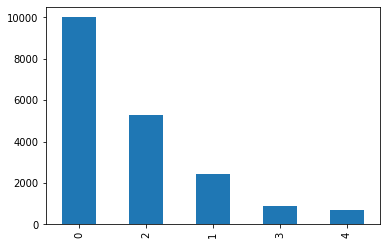

In [28]:
sampled_df['diagnosis'].value_counts().plot(kind='bar');

In [8]:
counts = np.unique(train_df['diagnosis'].values, return_counts=True)

In [9]:
counts

(array([0, 1, 2, 3, 4]), array([1805,  370,  999,  193,  295]))

In [10]:
i = 0
#img = mpimg.imread('../data/train_images/%s.png' % train_df.iloc[i]["id_code"])

img = cv2.imread('../data/train_images/%s.png' % train_df.iloc[i]["id_code"])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # ****************************

In [11]:
img.shape


(2136, 3216, 3)

In [12]:
np.max(img), np.min(img)

(255, 0)

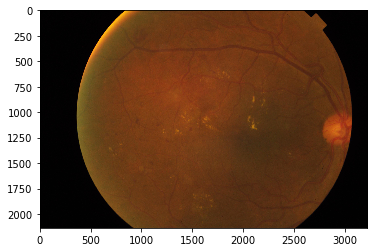

In [13]:
plt.imshow(img)

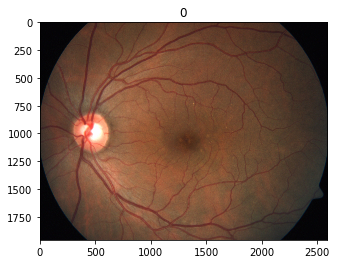

In [14]:
# plot some random training images with their ground truth labels
i = random.choice(range(train_df.shape[0]))
img = mpimg.imread('../data/train_images/' + train_df.iloc[i]['id_code'] + '.png')
plt.imshow(img)
plt.title(train_df.iloc[i]['diagnosis'])
plt.show()

In [15]:
train_df['diagnosis'].value_counts()

0    1805
2     999
1     370
4     295
3     193
Name: diagnosis, dtype: int64

### See some images

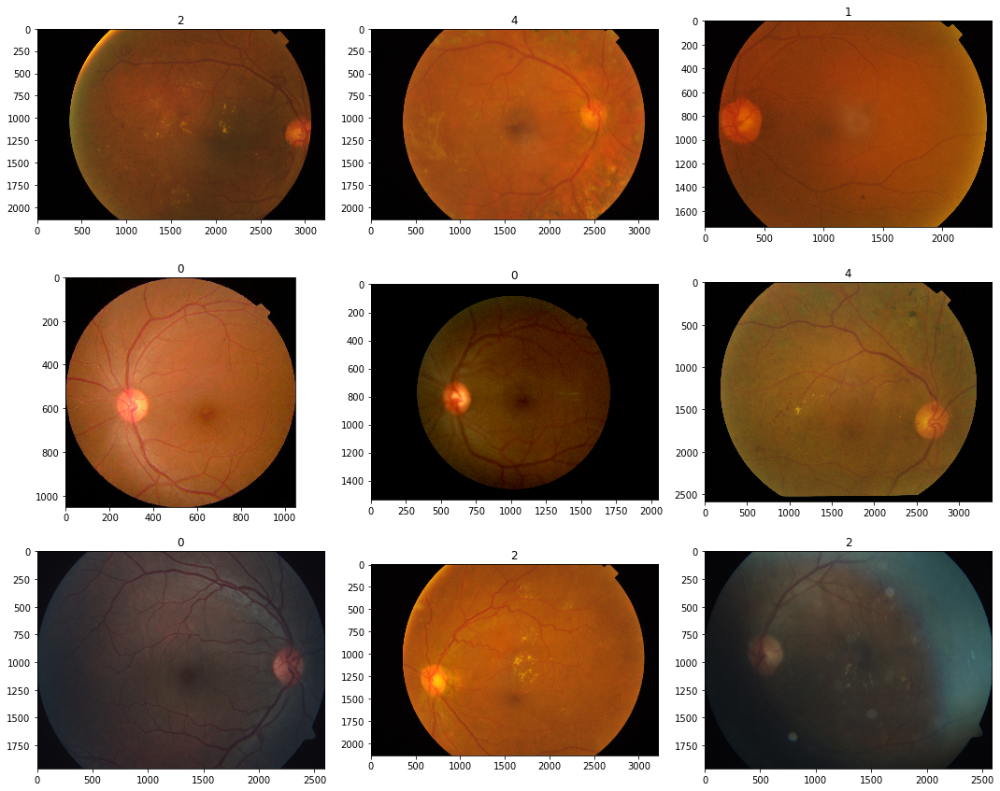

In [16]:
def display_samples(df, columns=3, rows=3):
    fig=plt.figure(figsize=(5*columns, 4*rows))

    for i in range(columns*rows):
        image_path = df.loc[i,'id_code']
        image_id = df.loc[i,'diagnosis']
        img = cv2.imread(f'../data/train_images/{image_path}.png')
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        fig.add_subplot(rows, columns, i+1)
        plt.title(image_id)
        plt.imshow(img)
    
    plt.tight_layout()

display_samples(train_df)

In [35]:
SEED=0
IMG_SIZE = 512
NUM_CLASSES = 5
SEED = 77
TRAIN_NUM = 1000 # use 1000 when you just want to explore new idea, use -1 for full train



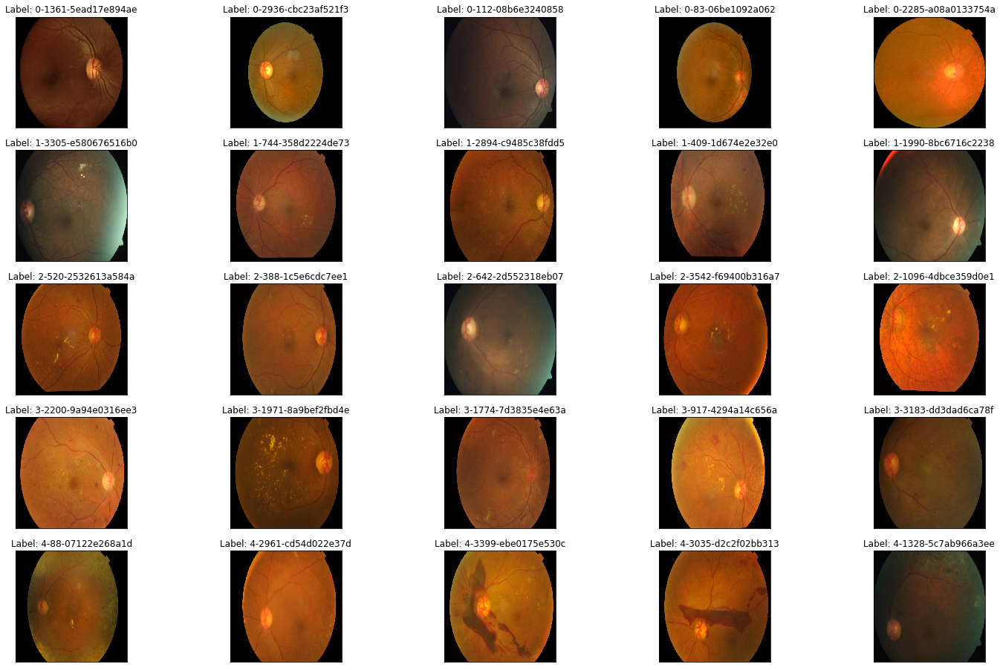

In [19]:

fig = plt.figure(figsize=(25, 16))
# display 10 images from each class
for class_id in sorted(train_df['diagnosis'].unique()):
    for i, (idx, row) in enumerate(train_df.loc[train_df['diagnosis'] == class_id].sample(5, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"../data/train_images/{row['id_code']}.png"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))

        plt.imshow(image)
        ax.set_title('Label: %d-%d-%s' % (class_id, idx, row['id_code']) )
        

### Bengrahm's preprocessing

In [97]:
def crop_image_from_gray(img, tol=7):
    if img.ndim == 2:
        mask = img > tol
        return img[np.ix_(mask.any(1), mask.any(0))]
    elif img.ndim == 3:
        gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        mask = gray_img > tol
        check_shape = img[:, :, 0][np.ix_(mask.any(1), mask.any(0))].shape[0]
        if check_shape == 0:  # image is too dark so that we crop out everything,
            return img  # return original image
        else:
            img1 = img[:, :, 0][np.ix_(mask.any(1), mask.any(0))]
            img2 = img[:, :, 1][np.ix_(mask.any(1), mask.any(0))]
            img3 = img[:, :, 2][np.ix_(mask.any(1), mask.any(0))]
            img = np.stack([img1, img2, img3], axis=-1)
        return img

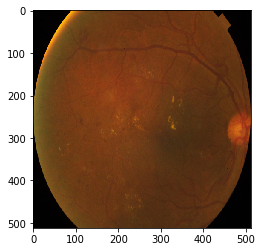

In [246]:
path = "../data/train_images/000c1434d8d7.png"
IMG_SIZE = 512
image = cv2.imread(path)
#image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = crop_image_from_gray(image)
gray_image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
plt.imshow(gray_image, cmap="gray"); plt.show()


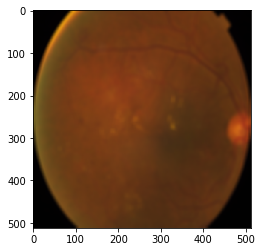

In [262]:
#cv2.GaussianBlur(img, kernel, sigmaX), kernel should be of odd shape, sigmaX is std in X direction, by default sigmaY = sigmaX
#They can be zero's and then they are computed from sigma. 
gauss_img = cv2.GaussianBlur(gray_image , (11, 11) , 10) # what is the ksize then?
plt.imshow(gauss_img, cmap="gray")

In [266]:
cv2.getGaussianKernel(9, 10) # the values are selected from a normal distribution, imagine a norm dist with given sigmaX (here 2nd arg), you gotta select values at 0 in the middle of the kernel
# then equal values from each sides (+x plane and -ve x plane)

array([[0.10599994],
       [0.10977562],
       [0.11255461],
       [0.11425565],
       [0.11482836],
       [0.11425565],
       [0.11255461],
       [0.10977562],
       [0.10599994]])

In [264]:
# dst = alpha * img1 + beta * img2 + gamma
# cv2.addWeighted(img1, alpha, img2, beta, gamma)
image = cv2.addWeighted(gray_image, 4, gauss_img ,-4 , 128) #  
#image = 4 * gray_image - 4* gauss_img + 128

#image += 128

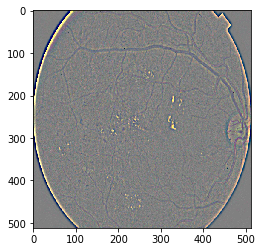

In [265]:
plt.imshow(image, cmap="gray")

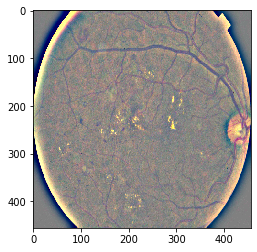

In [250]:
img = np.load('../data/npy_files/bgcc456/000c1434d8d7.npy')
plt.imshow(img)

In [ ]:
# one of the comments:
#It may be interesting to experiment with a Median filter, rather than a Gaussian filter. The Median filter is much better at separating small or narrow objects (e.g. blood vessels,
#spots, etc.) from a rather smooth background.
# https://www.kaggle.com/ratthachat/aptos-updatedv14-preprocessing-ben-s-cropping#571542

### Tom's circle crop

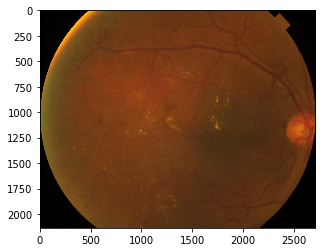

In [185]:
img = cv2.imread(path)
img = crop_image_from_gray(img)    
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

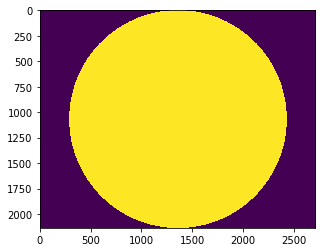

In [186]:
height, width, depth = img.shape    
x = int(width/2)
y = int(height/2)
r = np.amin((x,y))
circle_img = np.zeros((height, width), np.uint8)
cv2.circle(circle_img, (x,y), int(r), 1, thickness=-1) # img, center, radius, color(pixel value), thickness (-1 fill all inside)
plt.imshow(circle_img)

In [187]:
np.unique(circle_img)

array([0, 1], dtype=uint8)

In [188]:
# dst = img1 & img2
#The operation of "And" will be performed only if mask[i] doesn't equal zero, else the the result of and operation will be zero. 
img = cv2.bitwise_and(img, img, mask=circle_img) 

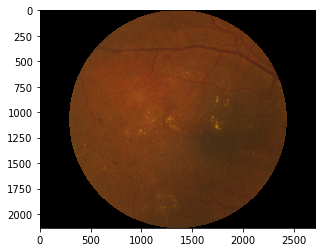

In [190]:
plt.imshow(img) # so basically, circle crop the image from the center, with max possible radius, we may lose information which comes out of the circle, like see the fundus is lost

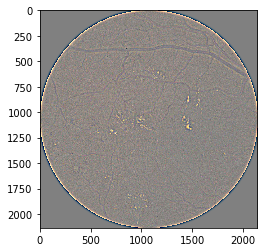

In [183]:
img = crop_image_from_gray(img)
img=cv2.addWeighted ( img,4, cv2.GaussianBlur( img , (0,0) , 10) ,-4 ,128)
plt.imshow(img)


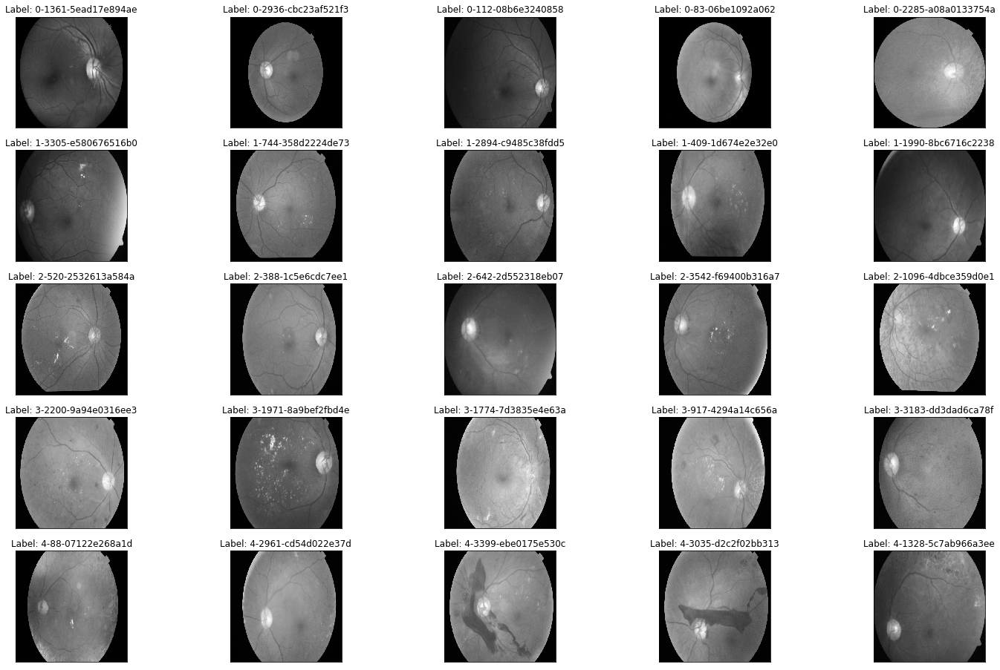

In [102]:
fig = plt.figure(figsize=(25, 16))
for class_id in sorted(train_df['diagnosis'].unique()):
    for i, (idx, row) in enumerate(train_df.loc[train_df['diagnosis'] == class_id].sample(5, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"../data/train_images/{row['id_code']}.png"
        image = cv2.imread(path)
        
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
#         image=cv2.addWeighted ( image, 0 , cv2.GaussianBlur( image , (0 ,0 ) , 10) ,-4 ,128)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))

        plt.imshow(image, cmap='gray')
        ax.set_title('Label: %d-%d-%s' % (class_id, idx, row['id_code']) )



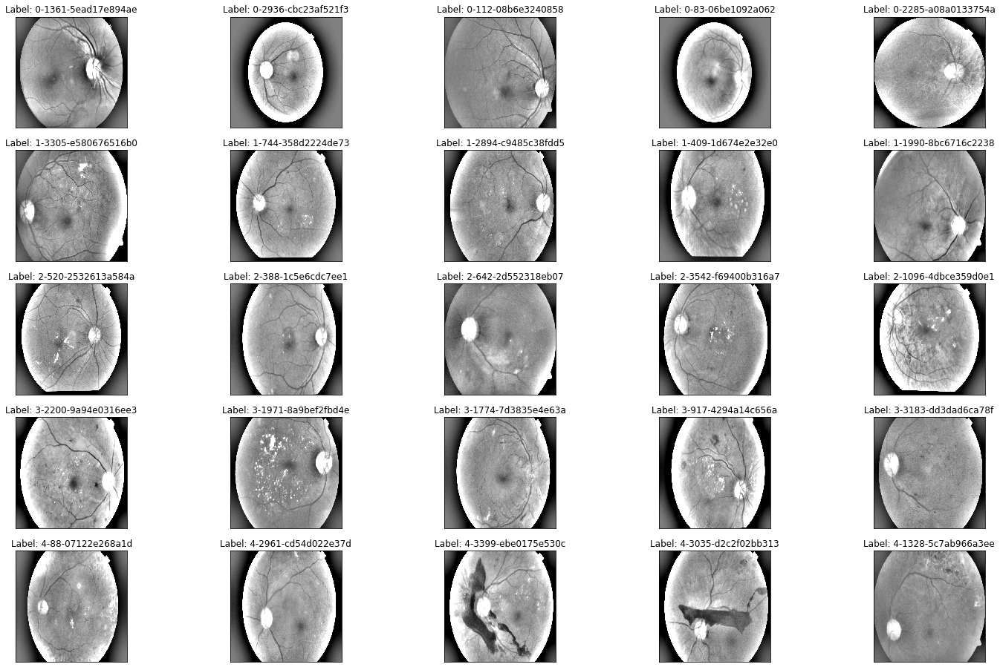

In [40]:
fig = plt.figure(figsize=(25, 16))
for class_id in sorted(train_df['diagnosis'].unique()):
    for i, (idx, row) in enumerate(train_df.loc[train_df['diagnosis'] == class_id].sample(5, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"../data/train_images/{row['id_code']}.png"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
        image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , IMG_SIZE/10) ,-4 ,128) # the trick is to add this line

        plt.imshow(image, cmap='gray')
        ax.set_title('Label: %d-%d-%s' % (class_id, idx, row['id_code']) )

### Exploring old data

In [20]:
train_old = pd.read_csv('../data/train_old.csv')
train_old.shape

(35126, 2)

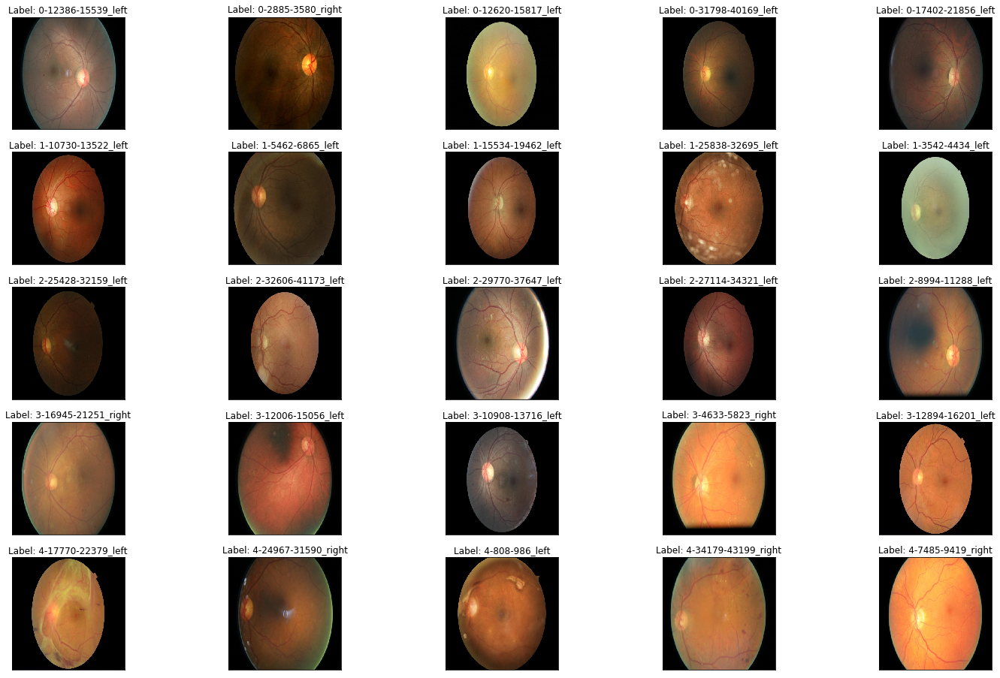

In [26]:

fig = plt.figure(figsize=(25, 16))
# display 10 images from each class
for class_id in sorted(train_old['diagnosis'].unique()):
    for i, (idx, row) in enumerate(train_old.loc[train_old['diagnosis'] == class_id].sample(5, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"../external_data/train_images/{row['id_code']}.jpeg"
        #print(path)
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))

        plt.imshow(image)
        ax.set_title('Label: %d-%d-%s' % (class_id, idx, row['id_code']) )
        

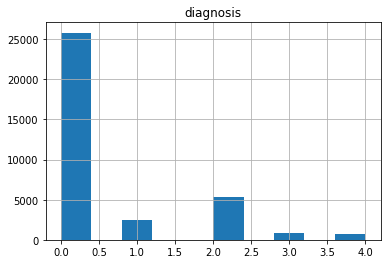

In [27]:
train_old[['diagnosis']].hist();

In [36]:
train_old['diagnosis'].value_counts()

0    25810
2     5292
1     2443
3      873
4      708
Name: diagnosis, dtype: int64

In [29]:
counts = train_df['diagnosis'].value_counts(normalize=True)
counts

0    0.492900
2    0.272802
1    0.101038
4    0.080557
3    0.052703
Name: diagnosis, dtype: float64

In [31]:
count_dict = {}
for i in counts.index:
    count_dict[i] = counts.loc[i]
    #print(i, counts.loc[i])
count_dict

{0: 0.4929000546149645,
 2: 0.272801747678864,
 1: 0.1010376843255052,
 4: 0.08055707263790278,
 3: 0.052703440742763515}

In [49]:
def sample(obj, replace=False, total=8000):
    return obj.sample(n=int(count_dict[obj.name] * total), replace=replace)

In [50]:
sampled_train = train_old.groupby('diagnosis').apply(sample).reset_index(drop=True)

In [53]:
sampled_train.shape

(7998, 2)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7ff1f029cd30>]],
      dtype=object)

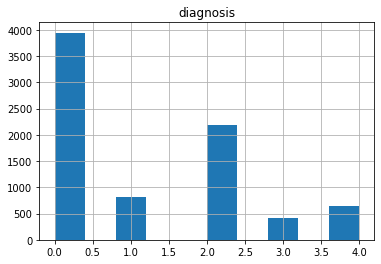

In [54]:
sampled_train[['diagnosis']].hist()

In [55]:
sampled_train['diagnosis'].value_counts()

0    3943
2    2182
1     808
4     644
3     421
Name: diagnosis, dtype: int64

In [ ]:
np.random.normal(0, 0.1)

#### Messidor

In [36]:
train_mes = pd.read_csv('../external_data/messidor/train_messidor.csv')

In [37]:
train_mes.head()

,id_code,diagnosis
0,20060523_50003_0100_PP,3
1,20060523_50019_0100_PP,3
2,20060523_50135_0100_PP,2
3,20060523_50153_0100_PP,0
4,20060523_50234_0100_PP,3


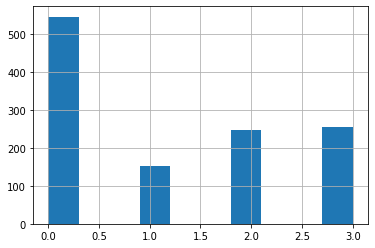

In [39]:
train_mes['diagnosis'].hist()

In [7]:
#messidor: 4-class labels (normal, mild, moderate, severe)
#kaggle dataset: 5-class labels (normal, mild, moderate, severe, end stage) 

In [25]:
train_mes.head()

,id_code,diagnosis
0,20060523_50003_0100_PP,3
1,20060523_50019_0100_PP,3
2,20060523_50135_0100_PP,2
3,20060523_50153_0100_PP,0
4,20060523_50234_0100_PP,3


In [40]:
train_mes['diagnosis'].value_counts(normalize=True)

0    0.455000
3    0.211667
2    0.205833
1    0.127500
Name: diagnosis, dtype: float64

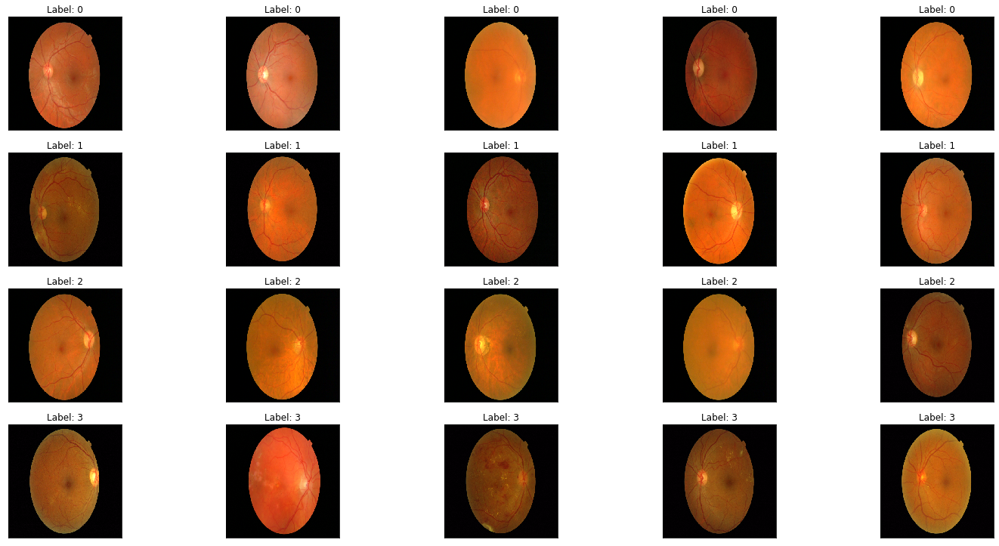

In [48]:

fig = plt.figure(figsize=(25, 16))
# display 10 images from each class
for class_id in sorted(train_mes['diagnosis'].unique()):
    for i, (idx, row) in enumerate(train_mes.loc[train_mes['diagnosis'] == class_id].sample(5, random_state=69).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"../external_data/messidor/train_images/{row['id_code']}.tif"
        #print(path)
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (512, 512))

        plt.imshow(image)
        ax.set_title('Label: %d'  % (class_id ))
        

#### Analyse npy files

In [17]:
def display_samples(df, columns=3, rows=3):
    fig=plt.figure(figsize=(5*columns, 4*rows))

    for i in range(columns*rows):
        image_path = df.loc[i,'id_code']
        image_id = df.loc[i,'diagnosis']
        img = np.load(f'../data/npy_files/bgcc300/{image_path}.npy')
        fig.add_subplot(rows, columns, i+1)
        plt.title(image_path)
        plt.imshow(img)
    
    plt.tight_layout()
train_1 = pd.read_csv('../data/train.csv')
train_2 = pd.read_csv('../data/train_old.csv')
train_3 = pd.read_csv('../data/train_messidor.csv')

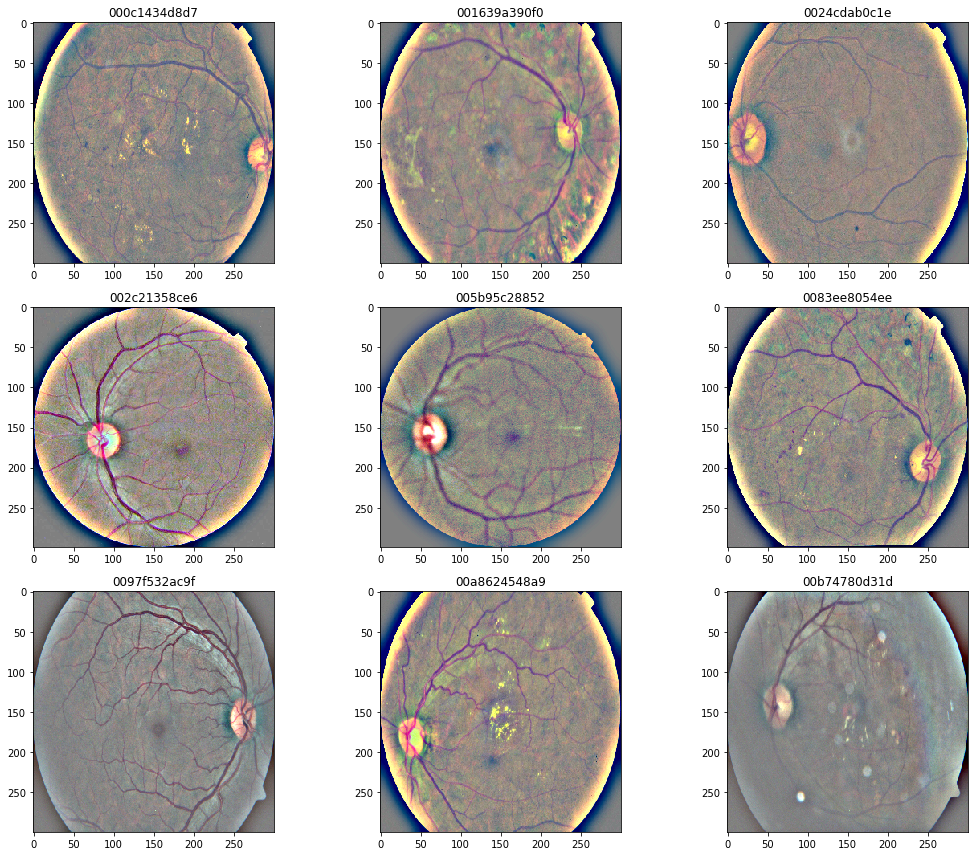

In [18]:
display_samples(train_1)

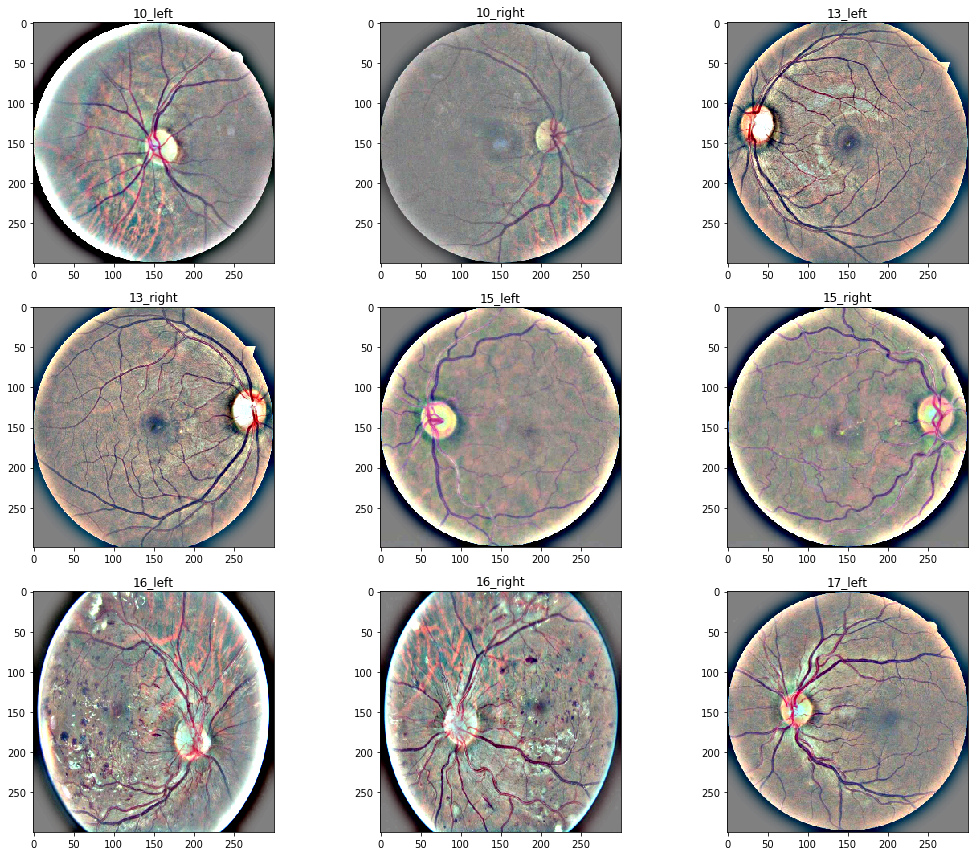

In [19]:
display_samples(train_2)

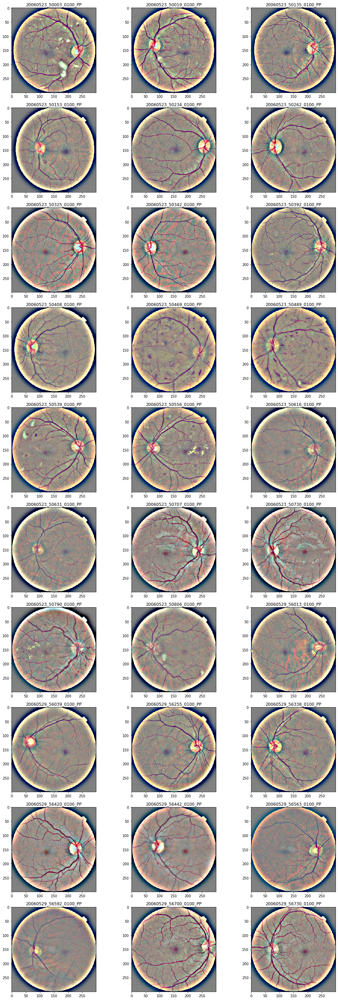

In [20]:
display_samples(train_3, 3, 10)

In [73]:
train_3.head(10)

,id_code,diagnosis
0,20060523_50003_0100_PP,3
1,20060523_50019_0100_PP,3
2,20060523_50135_0100_PP,2
3,20060523_50153_0100_PP,0
4,20060523_50234_0100_PP,3
5,20060523_50262_0100_PP,3
6,20060523_50325_0100_PP,0
7,20060523_50342_0100_PP,0
8,20060523_50392_0100_PP,2
9,20060523_50408_0100_PP,1


 The train_3's 20060523_50153_0100_PP.tif is not properly cropped due to a small white dot outside the retina circle, this can be fixed using high tol, like tol=10 in the ben_color_crop function in prepare_npy.ipynb, still I'll go with this, it's not an artifact model should learn to ignore it.

### Blurry images

In [53]:
train_df = pd.read_csv('../data/train.csv')
train_df.shape

(3662, 2)

In [4]:
img_size = 300
def crop_image_from_gray(img,tol=7):
    if img.ndim ==2:
        mask = img>tol
        return img[np.ix_(mask.any(1),mask.any(0))]
    elif img.ndim==3:
        gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        mask = gray_img>tol
        
        check_shape = img[:,:,0][np.ix_(mask.any(1),mask.any(0))].shape[0]
        if (check_shape == 0): # image is too dark so that we crop out everything,
            return img # return original image
        else:
            img1=img[:,:,0][np.ix_(mask.any(1),mask.any(0))]
            img2=img[:,:,1][np.ix_(mask.any(1),mask.any(0))]
            img3=img[:,:,2][np.ix_(mask.any(1),mask.any(0))]
            img = np.stack([img1,img2,img3],axis=-1)
        return img
def preprocess_image(img_file):
    img = cv2.imread(img_file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = crop_image_from_gray(img)
    img = cv2.resize(img, (img_size,img_size))
    return img

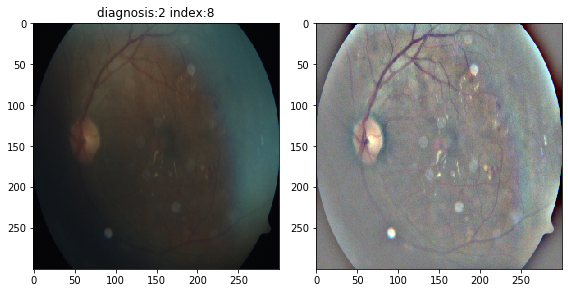

In [15]:
# a blurry image
fig=plt.figure(figsize=(8, 8))
image_path = train_df.loc[8,'id_code']
image_id = train_df.loc[8,'diagnosis']
img = preprocess_image(f'../data/train_images/{image_path}.png')
plt.subplot(1, 2, 1)
plt.title(f'diagnosis:{image_id} index:{8}')
plt.imshow(img)
plt.subplot(1, 2, 2)
img = np.load(f'../data/npy_files/bgcc300/{image_path}.npy')
plt.imshow(img)
plt.tight_layout()

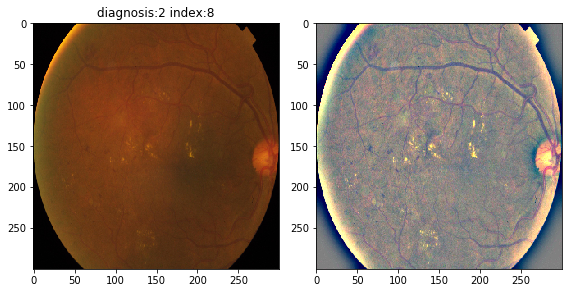

In [21]:
# a normal image
fig=plt.figure(figsize=(8, 8))
image_path = train_df.loc[0, 'id_code']
image_id = train_df.loc[0, 'diagnosis']
img = preprocess_image(f'../data/train_images/{image_path}.png')
plt.subplot(1, 2, 1)
plt.title(f'diagnosis:{image_id} index:{8}')
plt.imshow(img)
plt.subplot(1, 2, 2)
img = np.load(f'../data/npy_files/bgcc300/{image_path}.npy')
plt.imshow(img)
plt.tight_layout()

In [22]:
def isClear(img, threshold = 60):
    return cv2.Laplacian(img, cv2.CV_64F).var() > threshold

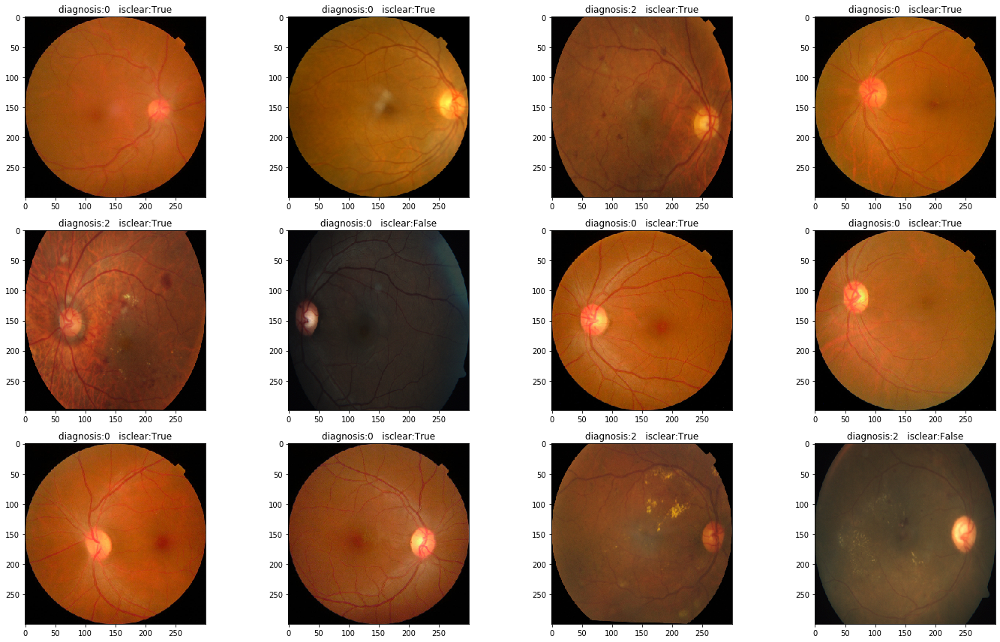

In [59]:
# plot some random images from train_df, see if they clear laplacian test or not
def display_samples(df, columns=4, rows=3):
    fig=plt.figure(figsize=(5*columns, 4*rows))
    for i in range(columns*rows):
        idx = np.random.randint(0, len(df)-1, 1)[0]
        image_path = df.loc[idx,'id_code']
        image_id = df.loc[idx,'diagnosis']
        img = preprocess_image(f'../data/train_images/{image_path}.png')
        fig.add_subplot(rows, columns, i+1)
        plt.title(f'diagnosis:{image_id}   isclear:{isClear(img)}')
        plt.imshow(img)
    plt.tight_layout()
display_samples(train_df)

In [64]:
import time
from tqdm import tqdm
blur_list = []
blur_list_id = []
start_time = time.time();
for i, image_id in enumerate(tqdm(train_df['id_code'])):
    img = preprocess_image(f'../data/train_images/{image_id}.png')
    if(not isClear(img, threshold=50)):
        blur_list.append(i)
        blur_list_id.append(image_id)
# train_df = train_df.drop(blur_list)

100%|██████████| 3662/3662 [05:18<00:00, 11.51it/s]


In [65]:
len(blur_list_id)

71

In [67]:
np.array(blur_list)

array([ 170,  182,  212,  300,  374,  453,  541,  563,  574,  587,  668,
        677,  832,  921, 1029, 1043, 1071, 1075, 1173, 1178, 1233, 1310,
       1341, 1399, 1472, 1485, 1522, 1587, 1600, 1678, 1695, 1798, 1799,
       1800, 1817, 1882, 1979, 1996, 2047, 2054, 2123, 2223, 2319, 2341,
       2392, 2568, 2621, 2625, 2679, 2717, 2751, 2755, 2815, 2842, 2878,
       2924, 2995, 3004, 3024, 3102, 3174, 3196, 3237, 3346, 3375, 3527,
       3553, 3593, 3600, 3644, 3661])

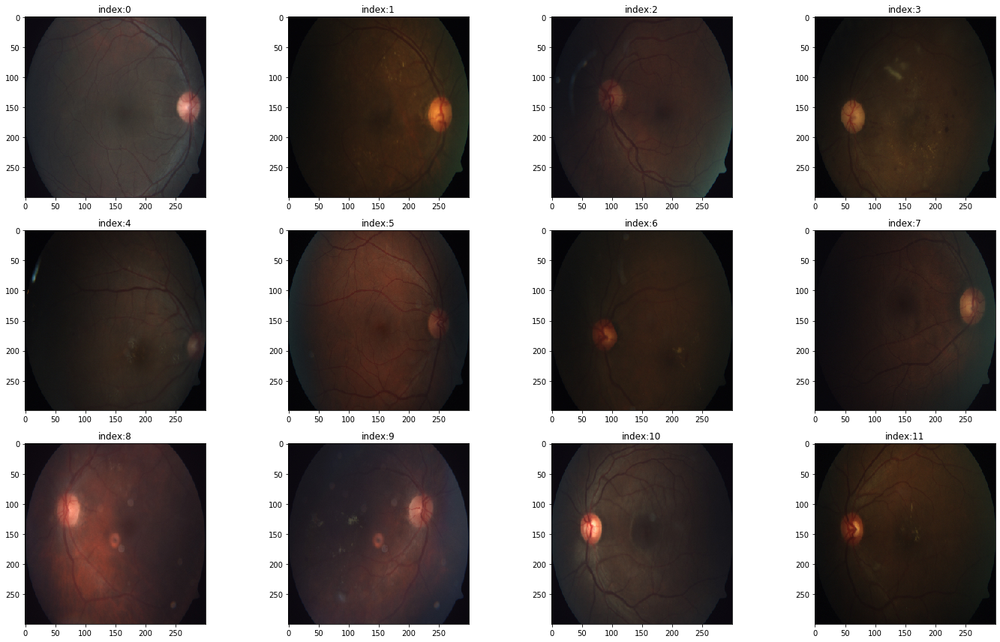

In [62]:
def display_blurry_samples(df, img_id_list, columns=4, rows=3):
    fig=plt.figure(figsize=(5*columns, 4*rows))
    for i in range(columns*rows):
        img = preprocess_image(f'../data/train_images/{img_id_list[i]}.png')
#         img = np.load(f'../data/npy_files/bgcc300/{img_id_list[i]}.npy')
        fig.add_subplot(rows, columns, i+1)
        plt.title(f'index:{i}')
        plt.imshow(img)
    plt.tight_layout()
display_blurry_samples(train_df, blur_list_id)
